<a href="https://colab.research.google.com/github/nelsonbeas33/procesamiento-datos/blob/main/tarea7/procesamiento_de_datos_tarea_7_audio.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

El procesamiento de señales de audio mediante herramientas como librosa nos permite explorar de manera cuantitativa y visual las características que definen la identidad sonora de diferentes géneros musicales. Al comparar samples de jazz, música clásica y pop, observamos que:

La forma de onda revela diferencias en la dinámica: mientras el jazz muestra fluctuaciones abruptas (improvisación), la música clásica tiende a tener estructuras más suaves y predecibles (notas sostenidas).

Los espectrogramas exponen la riqueza espectral: el pop suele concentrar energía en frecuencias medias (voces), mientras que lo clásico despliega armónicos complejos (instrumentos acústicos).

Los MFCCs capturan el "timbre" distintivo: el jazz, con sus instrumentos metálicos (saxo, trompeta), genera coeficientes más dispersos que el pop.

El tempo (BPM) confirma estereotipos genéricos, pero también invita a cuestionarlos: ¿es siempre el jazz más rápido que la clásica? Los datos pueden desafiar intuiciones.

In [ ]:
import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np
import IPython.display as ipd

# Cargar audios de ejemplo de librosa
audio_paths = {
    "Jazz": librosa.example('fishin'),       # Sample de jazz
    "Classical": librosa.example('brahms'),  # Sample clásico (Brahms)
    "Pop": librosa.example('nutcracker')     # Sample orquestal (adaptable como "pop")
}

audio_data = {}

In [ ]:
for genre, path in audio_paths.items():
    y, sr = librosa.load(path, sr=None)
    audio_data[genre] = (y, sr)
    print(f"{genre} cargado. Frecuencia de muestreo: {sr} Hz")
    ipd.display(ipd.Audio(y, rate=sr))  # Reproducir

Jazz cargado. Frecuencia de muestreo: 22050 Hz


Classical cargado. Frecuencia de muestreo: 22050 Hz


Pop cargado. Frecuencia de muestreo: 22050 Hz


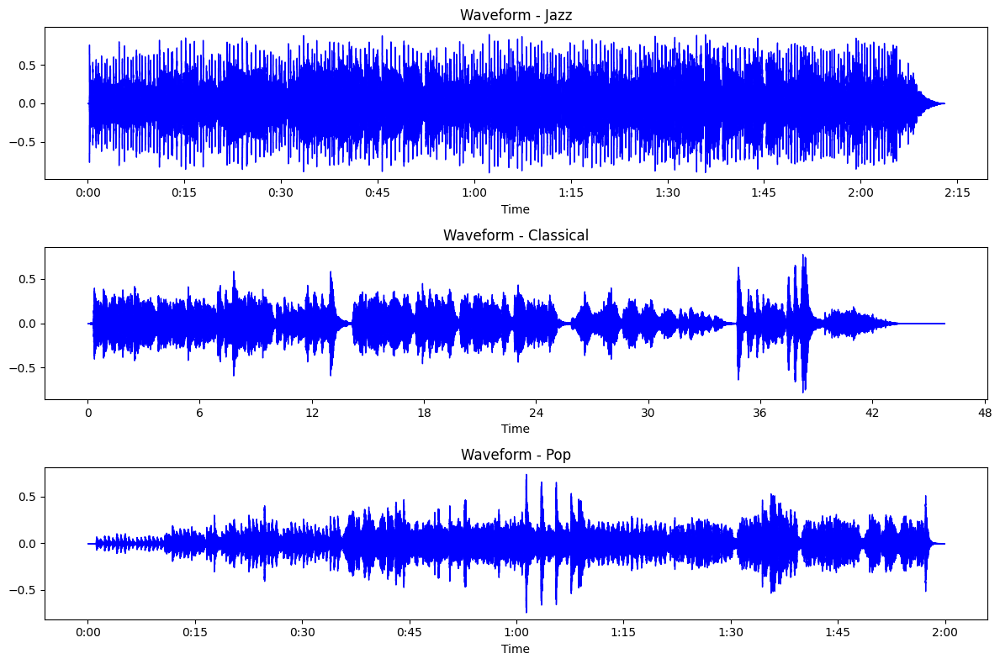

In [ ]:
plt.figure(figsize=(12, 8))
for i, (genre, (y, sr)) in enumerate(audio_data.items()):
    plt.subplot(3, 1, i+1)
    librosa.display.waveshow(y, sr=sr, color="blue")
    plt.title(f"Waveform - {genre}")
plt.tight_layout()
plt.show()

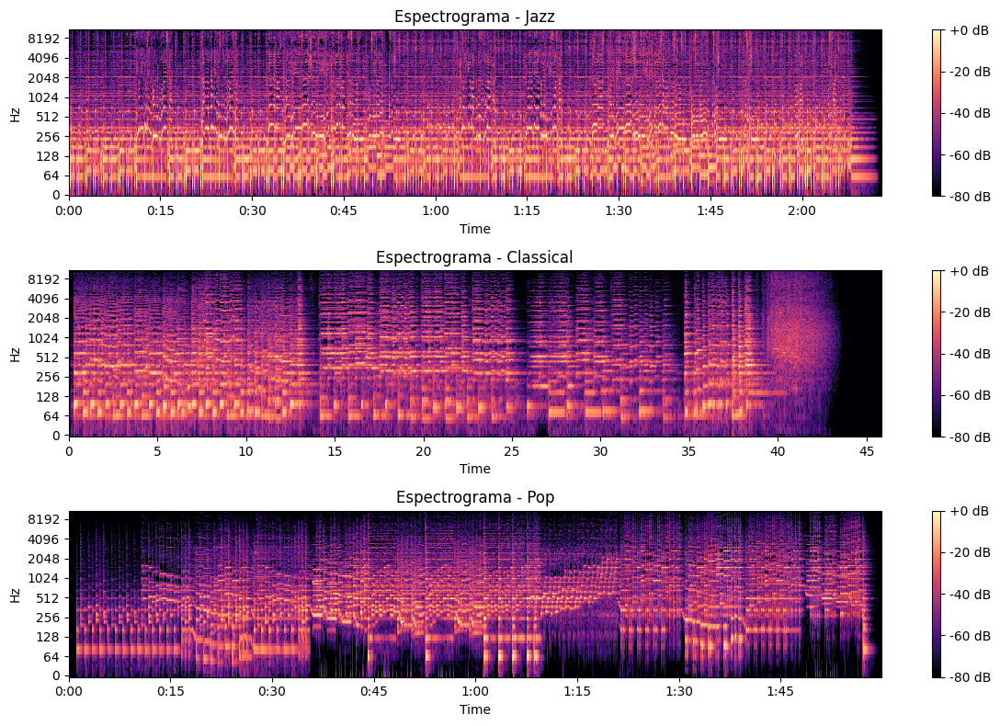

In [ ]:
plt.figure(figsize=(12, 8))
for i, (genre, (y, sr)) in enumerate(audio_data.items()):
    plt.subplot(3, 1, i+1)
    S = librosa.stft(y)
    S_db = librosa.amplitude_to_db(abs(S), ref=np.max)
    librosa.display.specshow(S_db, sr=sr, x_axis='time', y_axis='log')
    plt.colorbar(format='%+2.0f dB')
    plt.title(f"Espectrograma - {genre}")
plt.tight_layout()
plt.show()

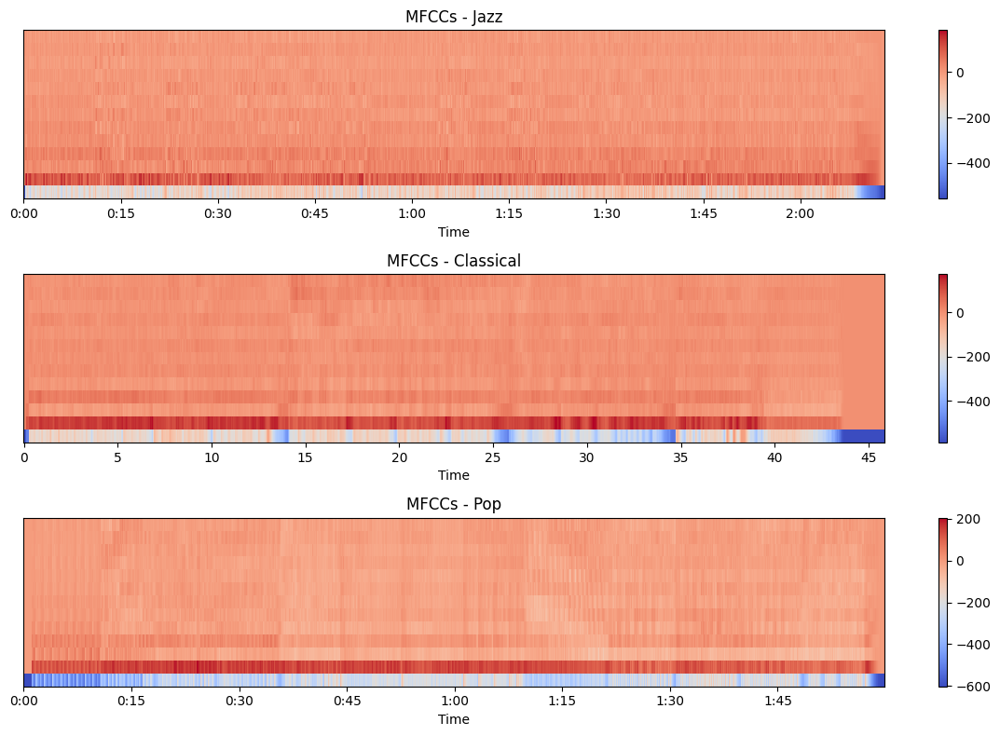

In [ ]:
plt.figure(figsize=(12, 8))
for i, (genre, (y, sr)) in enumerate(audio_data.items()):
    mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=13)
    plt.subplot(3, 1, i+1)
    librosa.display.specshow(mfccs, x_axis='time')
    plt.colorbar()
    plt.title(f"MFCCs - {genre}")
plt.tight_layout()
plt.show()

In [ ]:
for genre, (y, sr) in audio_data.items():
    tempo = librosa.beat.tempo(y=y, sr=sr)[0]
    print(f"{genre} - Tempo estimado: {tempo:.2f} BPM")

<ipython-input-6-7a9302f78182>:2: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)[0]


Jazz - Tempo estimado: 117.45 BPM
Classical - Tempo estimado: 143.55 BPM
Pop - Tempo estimado: 107.67 BPM
